In [32]:
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
import os
from collections import deque
from tensorflow.keras.models import load_model
from IPython.display import HTML
from base64 import b64encode

In [33]:
IMAGE_HEIGHT, IMAGE_WIDTH = 224, 224
SEQUENCE_LENGTH = 16
DATASET_DIR = "../data/"
CLASSES_LIST = ["NonViolence", "Violence"]

In [34]:
# To Show a Video in Notebook
def Play_Video(filepath):
    html = ''
    video = open(filepath,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

In [35]:
model_1 = load_model("../models/MobileNetV2_BiLSTM.h5")
model_2 = load_model("../models/MobileNetV2_BiLSTM_best.h5")

In [65]:

def predict_frames(model, video_file_path, output_file_path, SEQUENCE_LENGTH):
    
    # Read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # VideoWriter to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'), 
                                    video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
 
    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)
 
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():
 
        ok, frame = video_reader.read() 
        
        if not ok:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        print("Resized Frame Shape: ", resized_frame.shape)
        
        # Normalize the resized frame 
        normalized_frame = resized_frame / 255
        
        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)
        print("Frames Queue Length: ", len(frames_queue))
 
        # We Need at Least number of SEQUENCE_LENGTH Frames to perform a prediction.
        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:                        
 
            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = model.predict(np.expand_dims(frames_queue, axis = 0))[0]
            print("Seq np: ", np.expand_dims(frames_queue, axis = 0).shape)
            print("Predicted Labels Probabilities: ", predicted_labels_probabilities)
 
            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)
            print("Predicted Label: ", predicted_label)
 
            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]
            print("Predicted Class Name: ", predicted_class_name)
 
        # Write predicted class name on top of the frame.
        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)
         
        # Write The frame into the disk using the VideoWriter
        video_writer.write(frame)                       
        
    video_reader.release()
    video_writer.release()

In [66]:

plt.style.use("default")

# To show Random Frames from the saved output predicted video (output predicted video doesn't show on the notebook but can be downloaded)
def show_pred_frames(pred_video_path): 

    plt.figure(figsize=(20,15))

    video_reader = cv2.VideoCapture(pred_video_path)

    # Get the number of frames in the video.
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Get Random Frames from the video then Sort it
    random_range = sorted(random.sample(range (SEQUENCE_LENGTH , frames_count ), 12))
        
    for counter, random_index in enumerate(random_range, 1):
        
        plt.subplot(5, 4, counter)

        # Set the current frame position of the video.  
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
          
        ok, frame = video_reader.read() 

        if not ok:
          break 

        frame = cv2.cvtColor(frame , cv2.COLOR_BGR2RGB)

        plt.imshow(frame);plt.subplot().figure.set_size_inches(20,20);plt.tight_layout()
                            
    video_reader.release()

In [67]:
# Construct the output video path.
test_videos_directory = '../test_videos'
os.makedirs(test_videos_directory, exist_ok = True)
 
output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  1
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  2
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  3
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  4
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  5
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  6
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  7
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  8
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  9
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  10
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  11
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  12
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  13
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  14
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  15
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 613ms

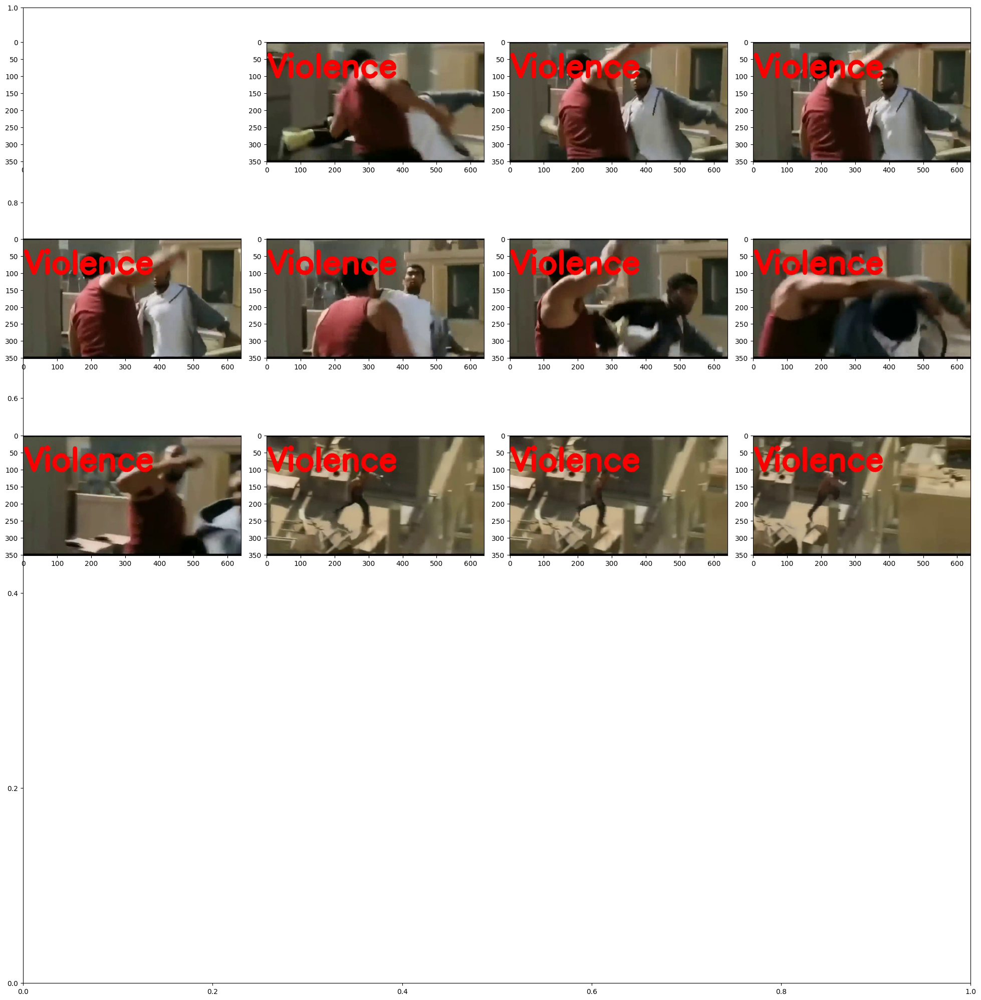

In [68]:
# Specifying video to be predicted
input_video_file_path = "../data/Violence/V_378.mp4"

# Perform Prediction on the Test Video.
predict_frames(model_1, input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  1
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  2
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  3
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  4
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  5
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  6
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  7
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  8
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  9
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  10
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  11
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  12
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  13
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  14
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  15
Resized Frame Shape:  (224, 224, 3)
Frames Queue Length:  16
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms

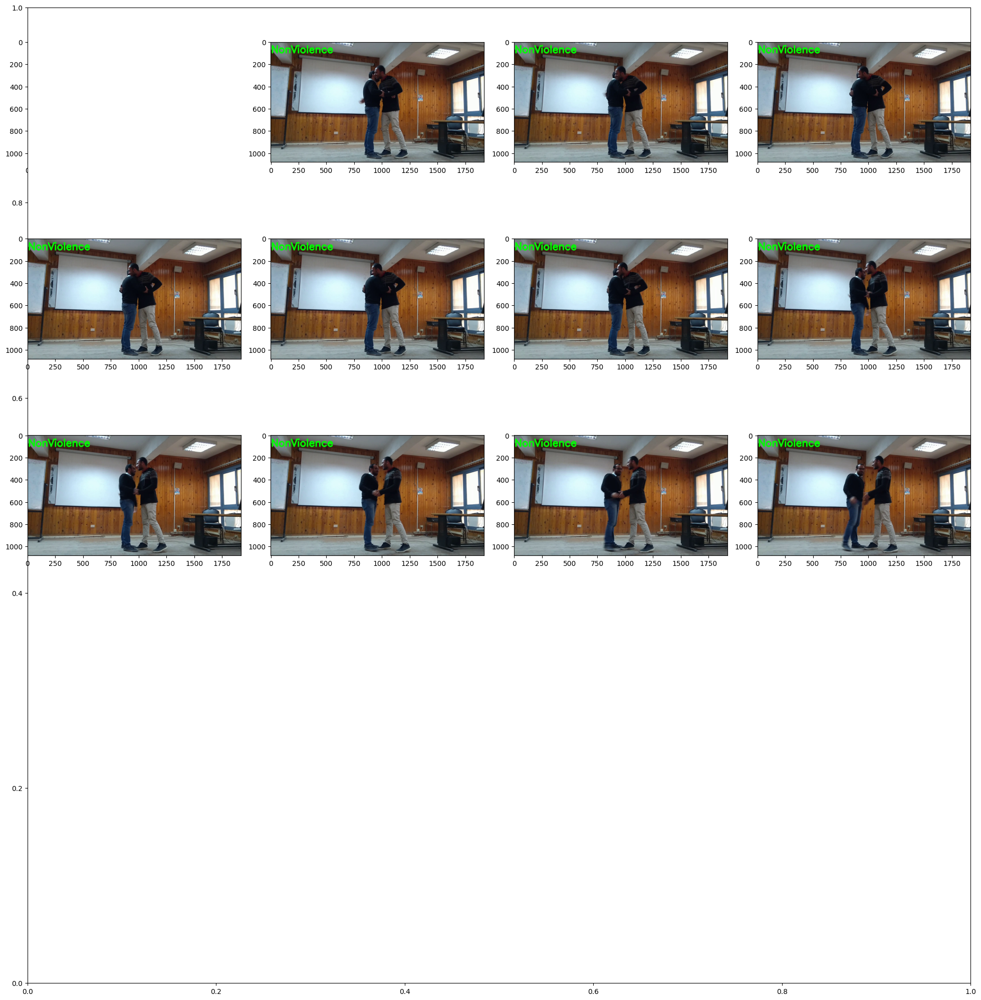

In [69]:
# Specifying video to be predicted
input_video_file_path = "../data/NonViolence/NV_1.mp4"

# Perform Prediction on the Test Video.
predict_frames(model_1, input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

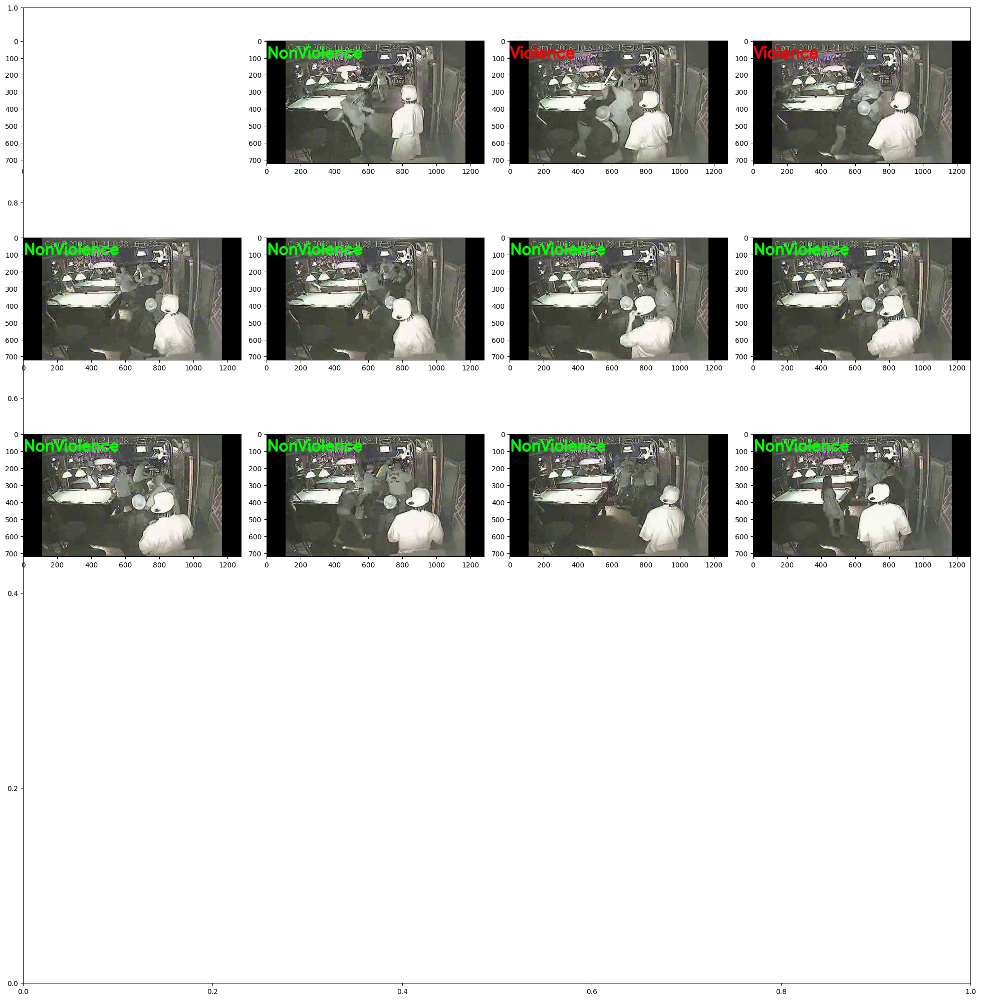

In [52]:
# Specifying video to be predicted
input_video_file_path = "../data/t_v004_converted.avi"

# Perform Prediction on the Test Video.
predict_frames(model_2, input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 574ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 723ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

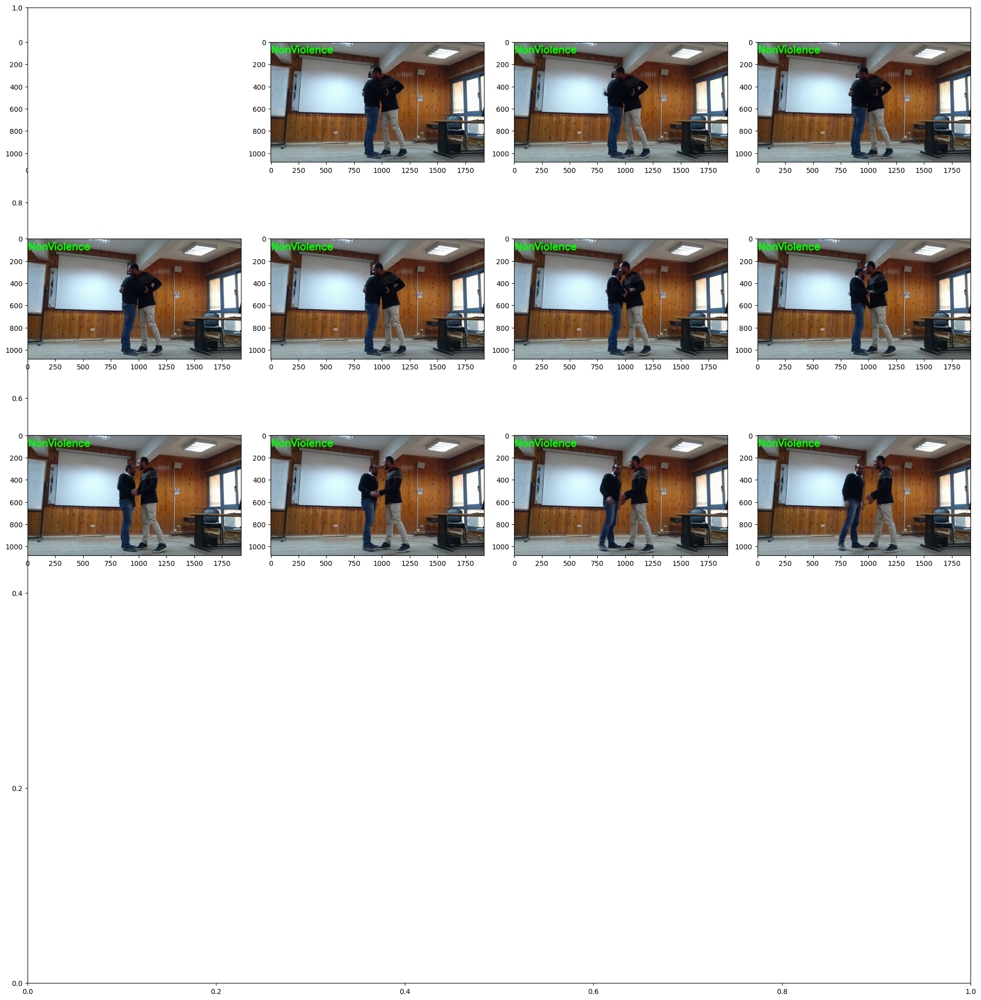

In [42]:
# Specifying video to be predicted
input_video_file_path = "../data/NonViolence/NV_1.mp4"

# Perform Prediction on the Test Video.
predict_frames(model_2, input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [43]:
def predict_video(model, video_file_path, SEQUENCE_LENGTH):
 
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # Declare a list to store video frames we will extract.
    frames_list = []
    
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)
 
    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):
 
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
 
        success, frame = video_reader.read() 
 
        if not success:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame.
        normalized_frame = resized_frame / 255
        
        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)
 
    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = model.predict(np.expand_dims(frames_list, axis = 0))[0]
 
    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)
 
    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]
    
    # Display the predicted class along with the prediction confidence.
    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
    video_reader.release()

In [44]:
# Specifying video to be predicted
input_video_file_path = "../data/Violence/V_276.mp4"

# Perform Single Prediction on the Test Video.
predict_video(model_1, input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step
Predicted: Violence
Confidence: 0.9934977293014526


In [45]:
# Specifying video to be predicted
input_video_file_path = "../data/NonViolence/NV_23.mp4"

# Perform Single Prediction on the Test Video.
predict_video(model_1, input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 882ms/step
Predicted: NonViolence
Confidence: 0.998542070388794


In [46]:
# Specifying video to be predicted
input_video_file_path = "../data/Violence/V_276.mp4"

# Perform Single Prediction on the Test Video.
predict_video(model_2, input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 837ms/step
Predicted: Violence
Confidence: 0.9915062785148621


In [48]:
# Specifying video to be predicted
input_video_file_path = "../data/NonViolence/NV_239.mp4"

# Perform Single Prediction on the Test Video.
predict_video(model_2, input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step
Predicted: NonViolence
Confidence: 0.9963531494140625
